In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import loompy
import anndata

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
adata = sc.read_loom('mese_data_Yike.loom', X_name='spliced', obs_names='cellID', var_names='GeneName', dtype='float32')
adata.obs_names_make_unique() 
adata

scanpy==1.6.0 anndata==0.7.4 umap==0.4.5 numpy==1.19.1 scipy==1.5.2 pandas==1.1.1 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


/usr/lib/python3.8/site-packages/loompy/loom_validator.py:48: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  with h5py.File(path) as f:


AnnData object with n_obs × n_vars = 4403 × 18072
    obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'TimepointHO', 'Treatment', 'Well', '_index', 'cellRoughSubtype', 'cellSubtype', 'cellSubtypeOld', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'mese_tSNE_1', 'mese_tSNE_2', 'number_of_genes_1plusreads'
    var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'

In [60]:
cells_subtypes1=adata.obs['cellSubtype'].isin(['Alveolar fibroblast','Fibroblast precursor','Adventitial fibroblast'])
adata_subtypes1=adata[cells_subtypes1]
adata_subtypes1 # 仅包括'Alveolar fibroblast','Fibroblast precursor','Adventitial fibroblast'的数据

/usr/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 2301 × 18072
    obs: 'DC', 'Gender', 'Mousename', 'Plate', 'SortType', 'Time [days]', 'Timepoint', 'TimepointHO', 'Treatment', 'Well', '_index', 'cellRoughSubtype', 'cellSubtype', 'cellSubtypeOld', 'cellType', 'coverage', 'doublet', 'embed_endo_1', 'embed_endo_2', 'fastq', 'mese_tSNE_1', 'mese_tSNE_2', 'number_of_genes_1plusreads'
    var: 'Chromosome', 'Gene stable ID', 'Strand', '_index', 'missing_info', 'n_geneIds'

ranking genes


/usr/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'DC' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Gender' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Mousename' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'SortType' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Time [days]' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Timepoint' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'TimepointHO' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Treatment' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Well' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cellRoughSubtype' a

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/usr/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:405: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


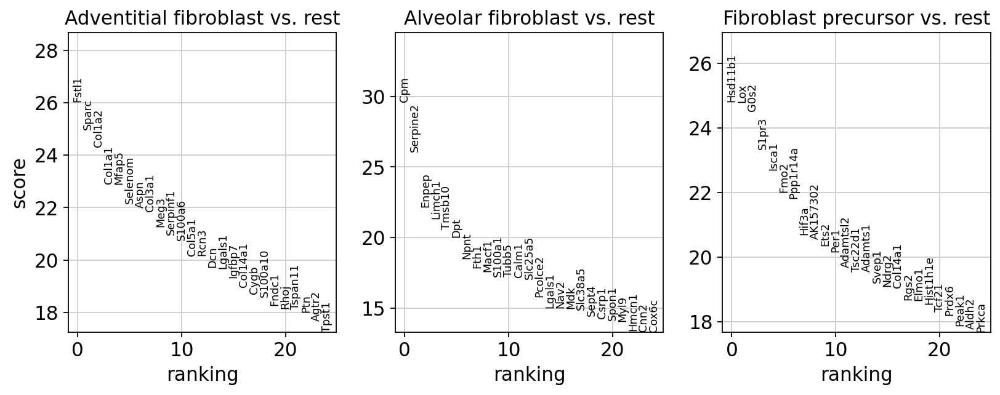

In [61]:
sc.tl.rank_genes_groups?
sc.tl.rank_genes_groups(adata_subtypes1, 'cellSubtype', method='wilcoxon')
sc.pl.rank_genes_groups(adata_subtypes1, n_genes=25, sharey=False)

In [62]:
A=adata_subtypes1.uns['rank_genes_groups']['names'][:100] #.to_excel('a.xlsx')
data = pd.DataFrame(A)
data.to_excel('excels/rank_genes_group_precursors&adventitial_and_alveolar.xlsx')

In [63]:
adata.var['_index']['Adh1']

'Adh1'

In [64]:
df=adata_subtypes1.obs.copy()
gbi=df.groupby('cellSubtype')

In [65]:
df['H19']=adata_subtypes1[:,'H19'].X.toarray()
df['Adh1']=adata_subtypes1[:,'Adh1'].X.toarray()
df['Stra6']=adata_subtypes1[:,'Stra6'].X.toarray()
df['Rbp1']=adata_subtypes1[:,'Rbp1'].X.toarray()
df['Hsd11b1']=adata_subtypes1[:,'Hsd11b1'].X.toarray()
df['Pdgfra']=adata_subtypes1[:,'Pdgfra'].X.toarray()
df['Pdgfa']=adata_subtypes1[:,'Pdgfa'].X.toarray()
df['Lox']=adata_subtypes1[:,'Lox'].X.toarray()
df['G0s2']=adata_subtypes1[:,'G0s2'].X.toarray()
df['Bcl2']=adata_subtypes1[:,'Bcl2'].X.toarray()
df['S1pr3']=adata_subtypes1[:,'S1pr3'].X.toarray()
df['Sgpp2']=adata_subtypes1[:,'Sgpp2'].X.toarray()
df['Rdh10']=adata_subtypes1[:,'Rdh10'].X.toarray()
df['Aldh1a2']=adata_subtypes1[:,'Aldh1a2'].X.toarray()

In [66]:
(df['Stra6']>0).sum()

39

In [67]:
df1=df.copy()
df.columns
genes=['H19','Adh1', 'Stra6', 'Rbp1', 'Hsd11b1', 'Pdgfra', 'Pdgfa', 'Lox', 'G0s2',
       'Bcl2', 'S1pr3', 'Sgpp2', 'Rdh10', 'Aldh1a2']
for gene in genes:
    df1[gene]=df[gene]>0

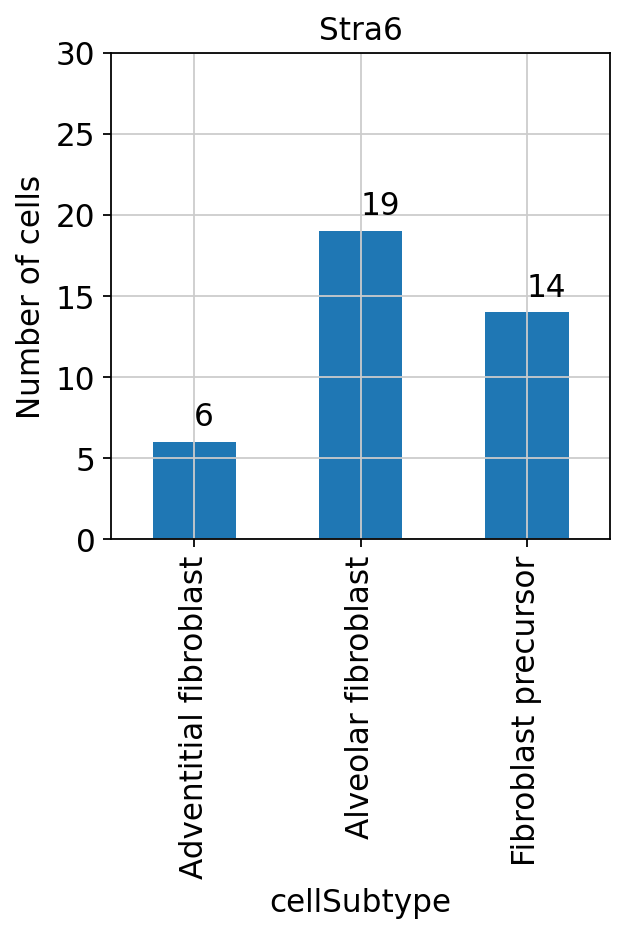

In [68]:
# expressing_number
Stra6_number=df1.groupby('cellSubtype').sum()['Stra6']
fig,ax=plt.subplots()
Stra6_number.plot.bar(ax=ax)
ax.text(0,7,'6')
ax.text(1,20,'19')
ax.text(2,15,'14')
ax.set_ylim(0,30)
ax.set_ylabel('Number of cells')
ax.set_title('Stra6')
plt.savefig('figures/Stra6 number.png')

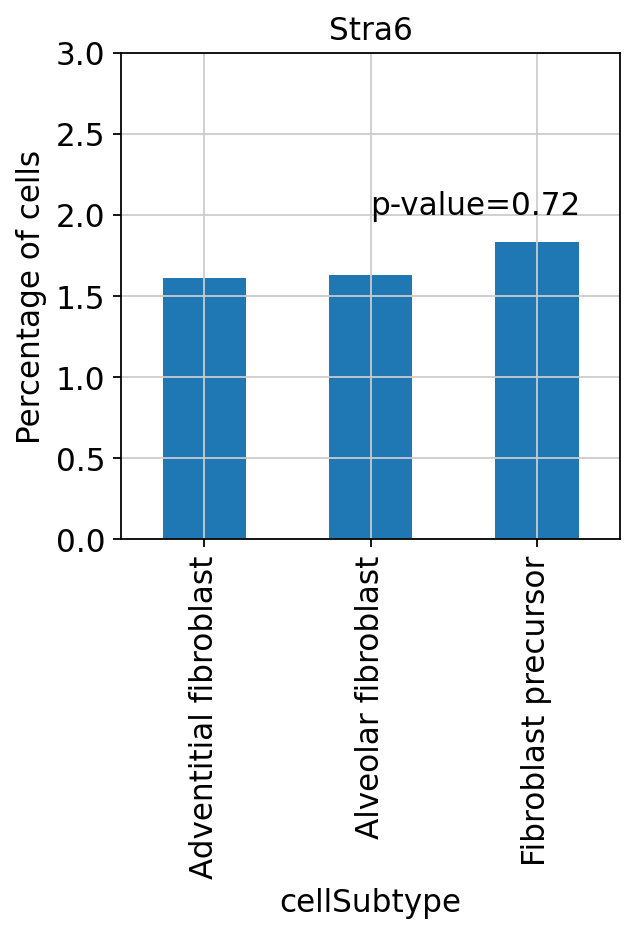

In [11]:
# expressing_fraction
fig,ax=plt.subplots()
(df1.groupby('cellSubtype').mean()['Stra6']*100).plot.bar(ax=ax)
ax.text(1,2,'p-value=0.72')
ax.set_ylim(0,3)
ax.set_ylabel('Percentage of cells')
ax.set_title('Stra6')
plt.savefig('figures/Stra6 percentage.png')

In [69]:
df1.groupby('cellSubtype').count()['Stra6']

cellSubtype
Adventitial fibroblast     373
Alveolar fibroblast       1164
Fibroblast precursor       764
Name: Stra6, dtype: int64

In [70]:
ctable=[[19,14],[1164-19,764-14]]

In [71]:
ctable

[[19, 14], [1145, 750]]

In [72]:
from scipy.stats import fisher_exact 

In [98]:
fisher_exact (ctable)

(0.8889582033686837, 0.7239732711583976)

In [75]:
dataplot_H19=gbi.mean()['H19']
dataplot_Adh1=gbi.mean()['Adh1']
dataplot_Stra6=gbi.mean()['Stra6']
dataplot_Rbp1=gbi.mean()['Rbp1']
dataplot_Hsd11b1=gbi.mean()['Hsd11b1']
dataplot_Pdgfra=gbi.mean()['Pdgfra']
dataplot_Pdgfa=gbi.mean()['Pdgfa']
dataplot_Lox=gbi.mean()['Lox']
dataplot_G0s2=gbi.mean()['G0s2']
dataplot_Bcl2=gbi.mean()['Bcl2']
dataplot_S1pr3=gbi.mean()['S1pr3']
dataplot_Sgpp2=gbi.mean()['Sgpp2']
dataplot_Rdh10=gbi.mean()['Rdh10']
dataplot_Aldh1a2=gbi.mean()['Aldh1a2']

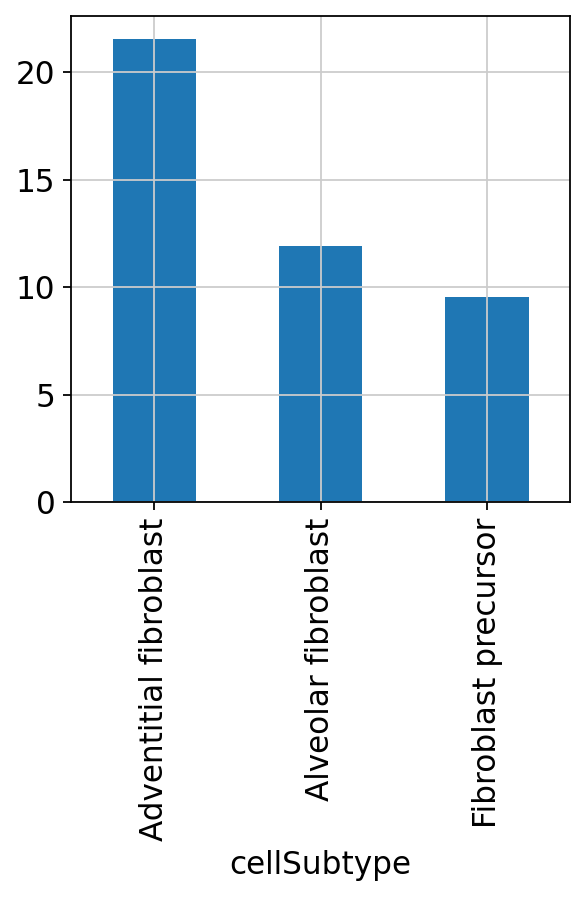

In [76]:
dataplot_Rdh10.plot.bar()
plt.savefig('figures/Rdh10 expression.png')
plt.show()

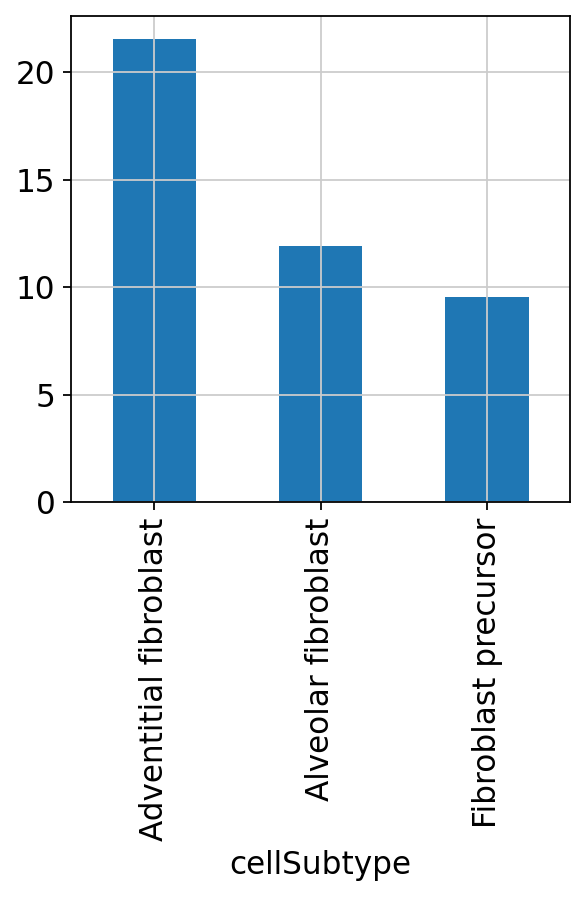

In [77]:
dataplot_Rdh10.plot.bar()
plt.savefig('figures/Rdh10 expression.png')
plt.show()

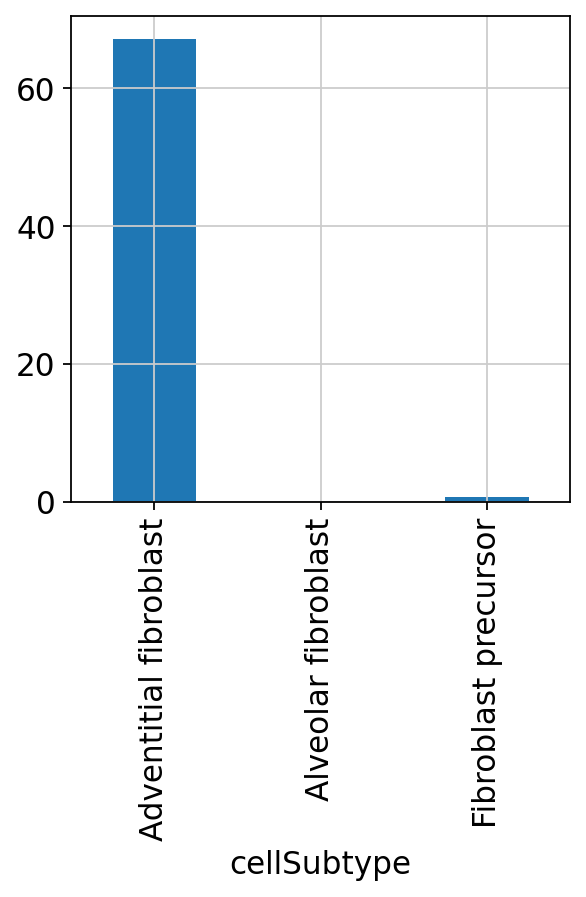

In [78]:
dataplot_Aldh1a2.plot.bar()
plt.savefig('figures/Aldh1a2 expression.png')
plt.show()

<AxesSubplot:xlabel='cellSubtype'>

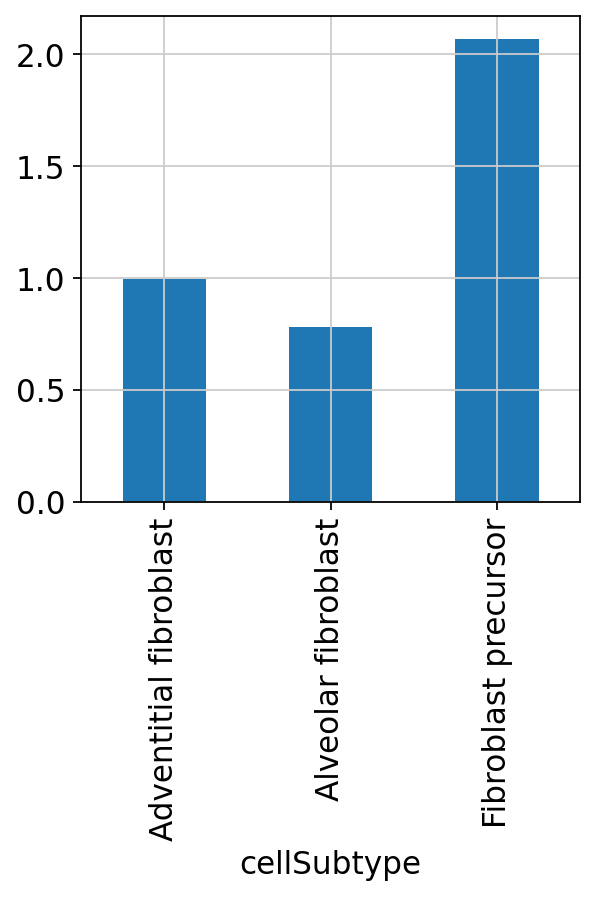

In [79]:
dataplot_Stra6.plot.bar()

In [80]:
dataplot_Stra6

cellSubtype
Adventitial fibroblast    0.998064
Alveolar fibroblast       0.781685
Fibroblast precursor      2.069019
Name: Stra6, dtype: float32

<AxesSubplot:xlabel='cellSubtype'>

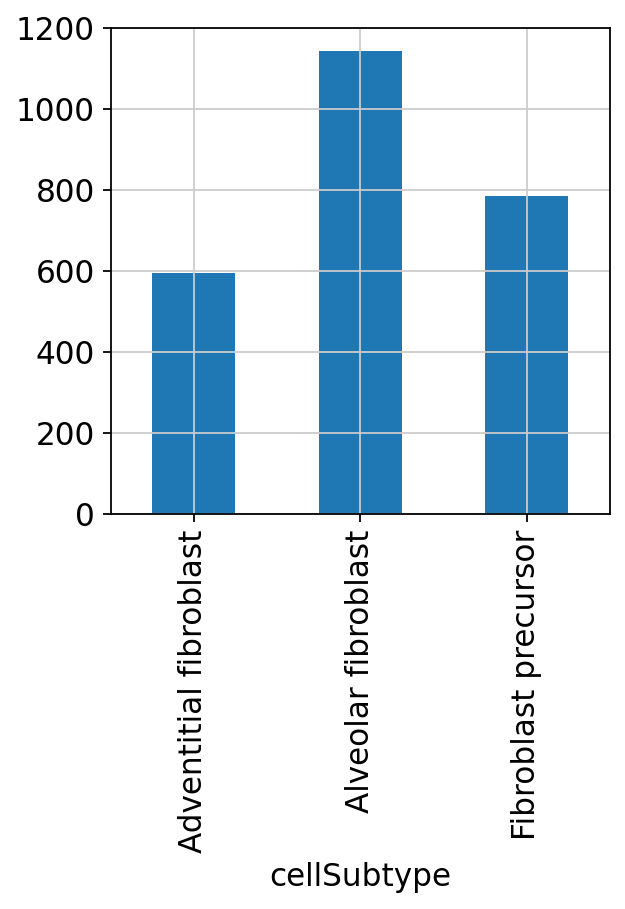

In [81]:
dataplot_Rbp1.plot.bar()

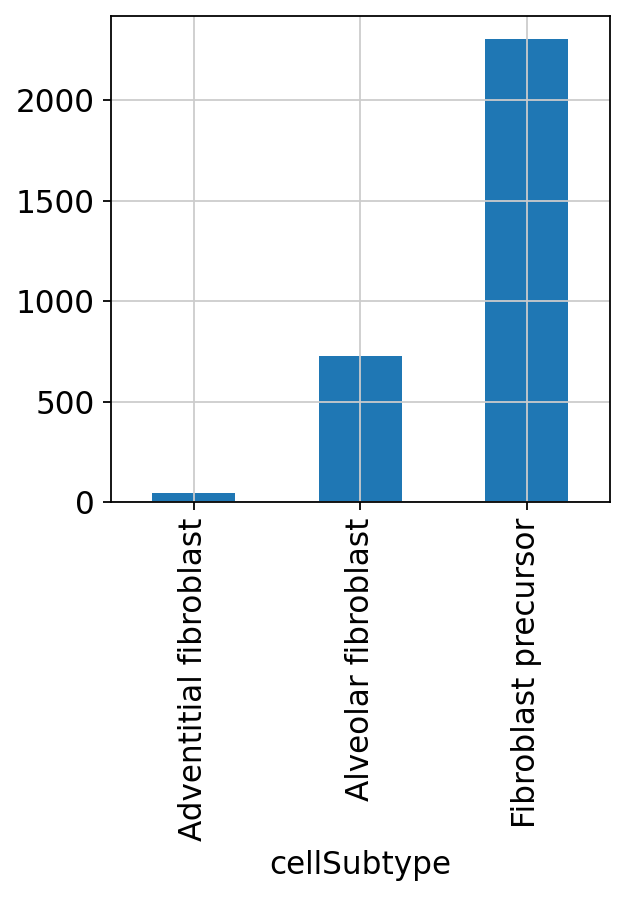

In [82]:
dataplot_Hsd11b1.plot.bar()
plt.savefig('figures/Hsd11b1 expression.png')
plt.show()

<AxesSubplot:xlabel='cellSubtype'>

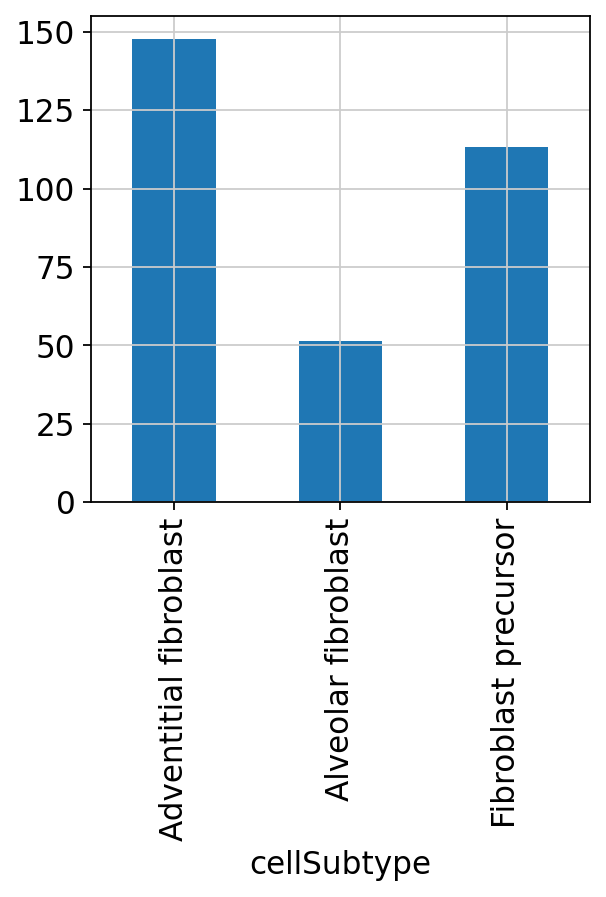

In [83]:
dataplot_Pdgfra.plot.bar()

<AxesSubplot:xlabel='cellSubtype'>

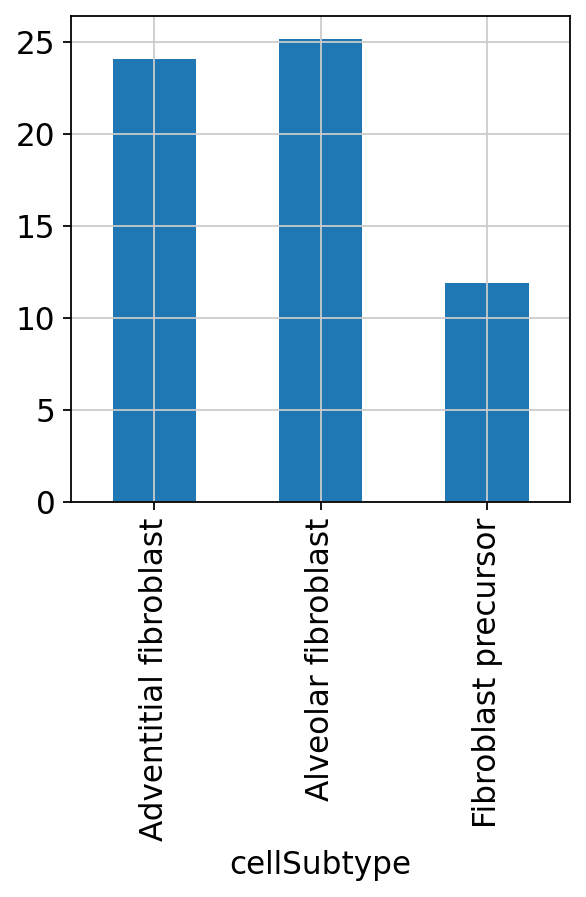

In [84]:
dataplot_Pdgfa.plot.bar()

<AxesSubplot:xlabel='cellSubtype'>

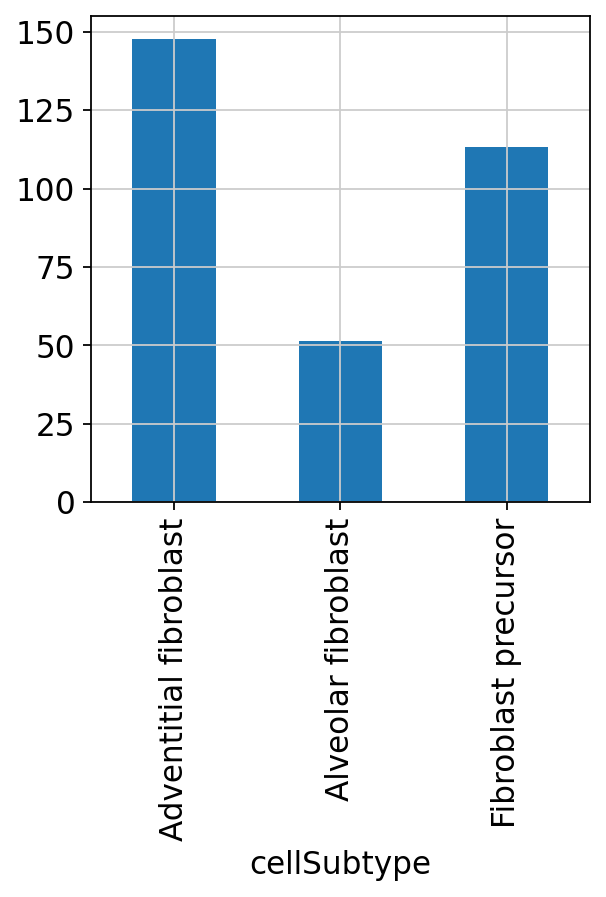

In [85]:
dataplot_Pdgfra.plot.bar()

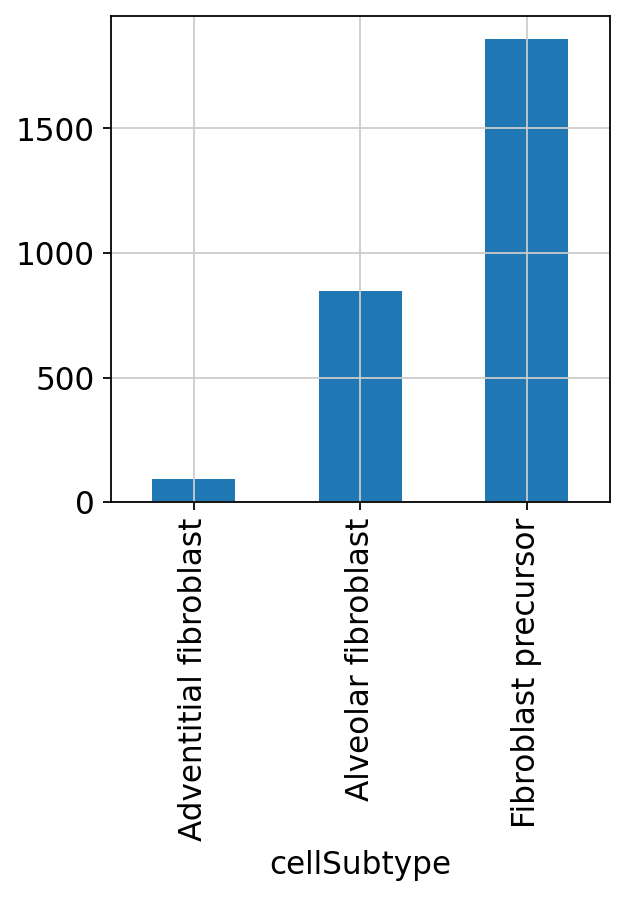

In [86]:
dataplot_G0s2.plot.bar()
plt.savefig('figures/G0s2 expression.png')
plt.show()

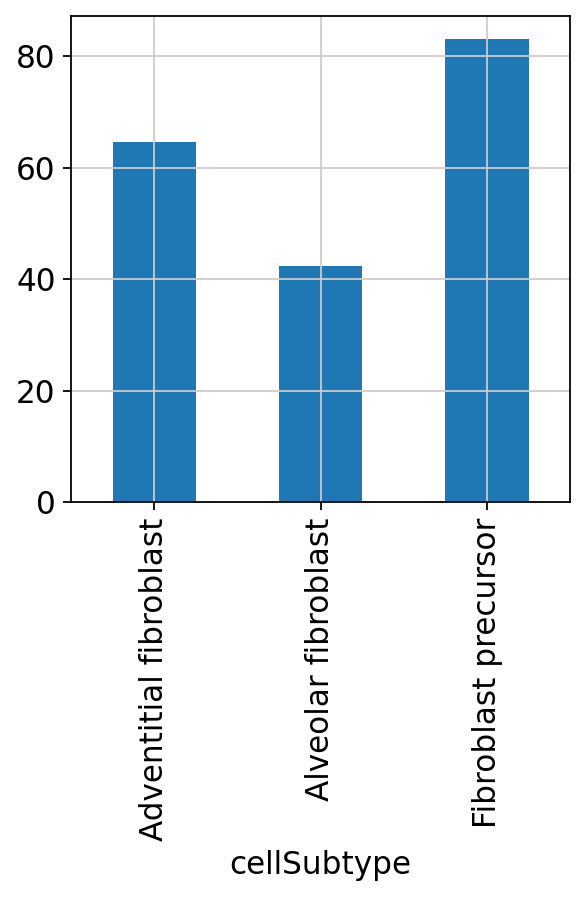

In [87]:
dataplot_Bcl2.plot.bar()
plt.savefig('figures/Bcl2 expression.png')
plt.show()

In [2]:
sc.pp.log1p(adata)
adata.obsm['X_tsne']=adata.obs[['mese_tSNE_1', 'mese_tSNE_2']]

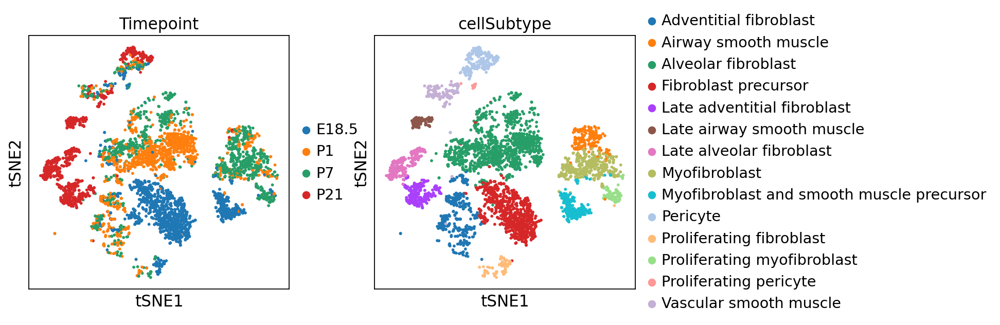

In [5]:
csts = [
        'Fibroblast precursor',
        'Proliferating fibroblast',
        'Early alveolar fibroblast',
        'Alveolar fibroblast',
        'Early adventitial fibroblast',
        'Adventitial fibroblast',
        'Myofibroblast and smooth muscle precursor',
        'Early airway smooth muscle',
        'Airway smooth muscle',
        'Myofibroblast',
        'Proliferating myofibroblast',
        'Vascular smooth muscle',
        'Pericyte',
        'Proliferating pericyte',
    ]
colors = sns.color_palette('husl', n_colors=len(csts))
colormap = dict(zip(csts, colors))

cmap = {
        'E18.5': 'navy',
        'P1': 'gold',
        'P7': 'tomato',
        'P21': 'firebrick',
        }
sc.pl.tsne(adata,color=['Timepoint','cellSubtype'])

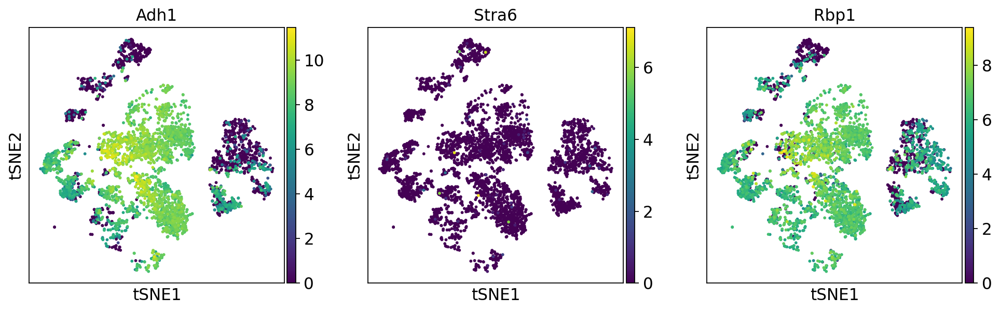

In [33]:
sc.pl.tsne(adata,color=['Adh1','Stra6','Rbp1'])

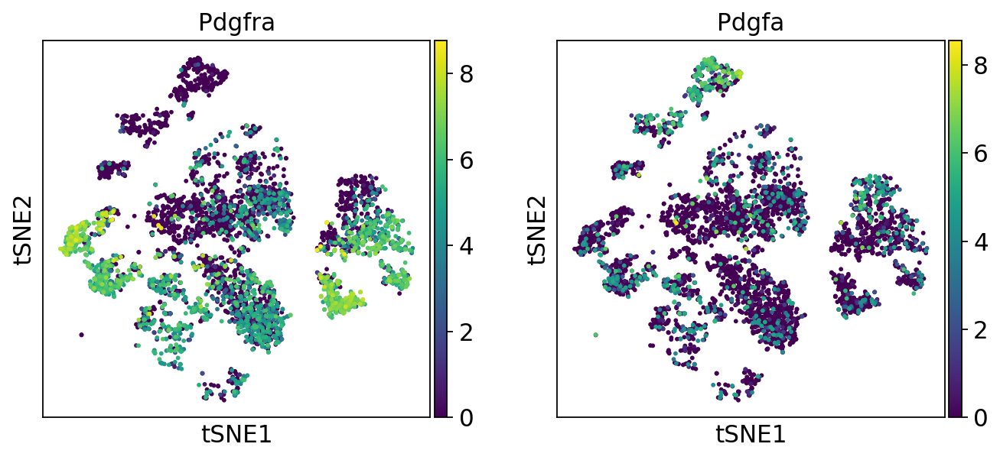

In [34]:
sc.pl.tsne(adata,color=['Pdgfra','Pdgfa'])

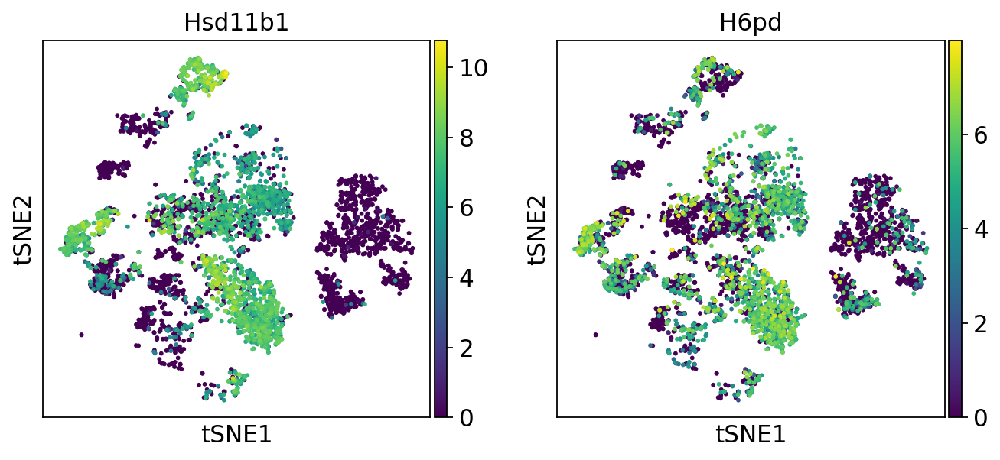

In [35]:
sc.pl.tsne(adata, color=['Hsd11b1', 'H6pd'], save='Hsd11b1 and H6pd expression.png')

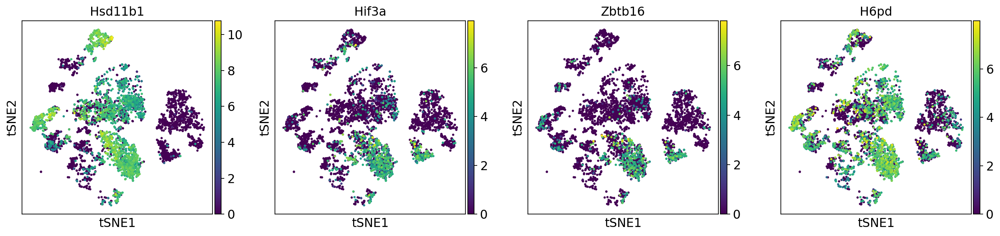

In [36]:
sc.pl.tsne(adata, color=['Hsd11b1', 'Hif3a','Zbtb16','H6pd'], save='Hsd11b1 blabla expression.png')

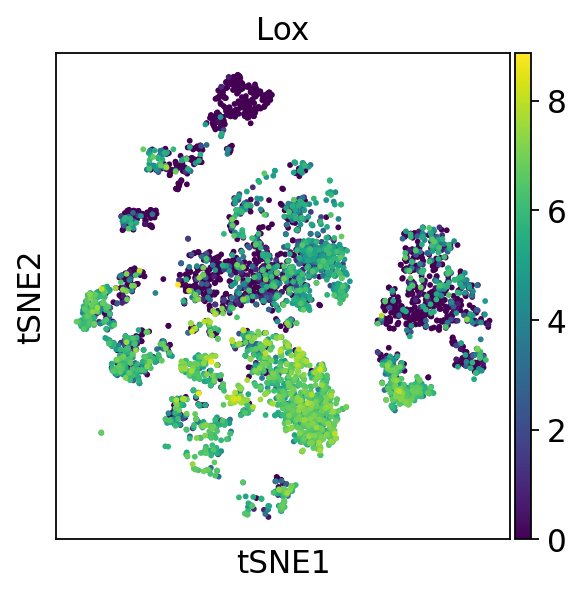

In [37]:
sc.pl.tsne(adata, color=['Lox'], save='Lox expression.png')

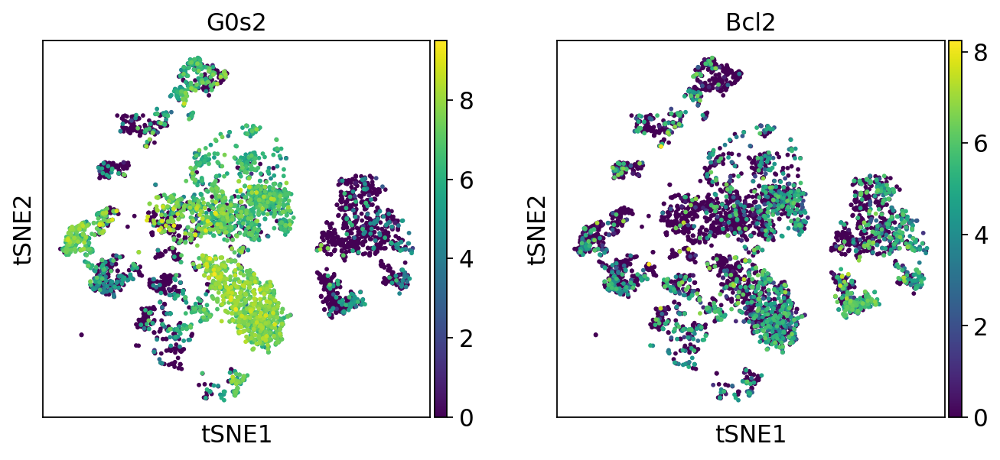

In [38]:
sc.pl.tsne(adata, color=['G0s2','Bcl2'], save='G0s2 and Bcl2 expression.png')

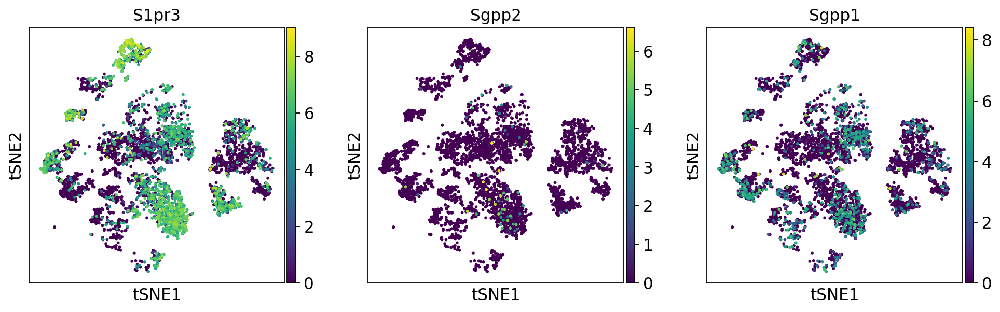

In [39]:
sc.pl.tsne(adata, color=['S1pr3','Sgpp2','Sgpp1'], save='S1pr3 and S1p expression.png')

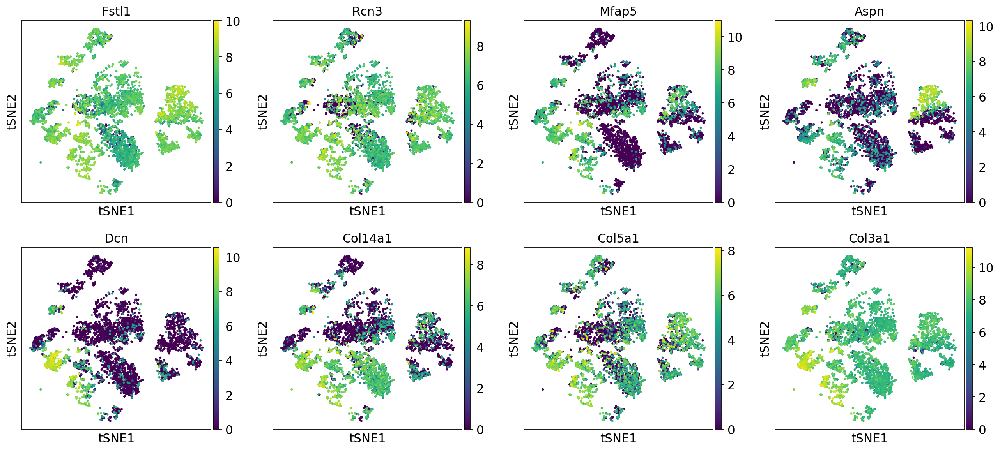

In [40]:
sc.pl.tsne(adata, color=['Fstl1','Rcn3','Mfap5', 'Aspn', 'Dcn', 'Col14a1', 'Col5a1','Col3a1'], save='Fstl1 bblabla expression.png')

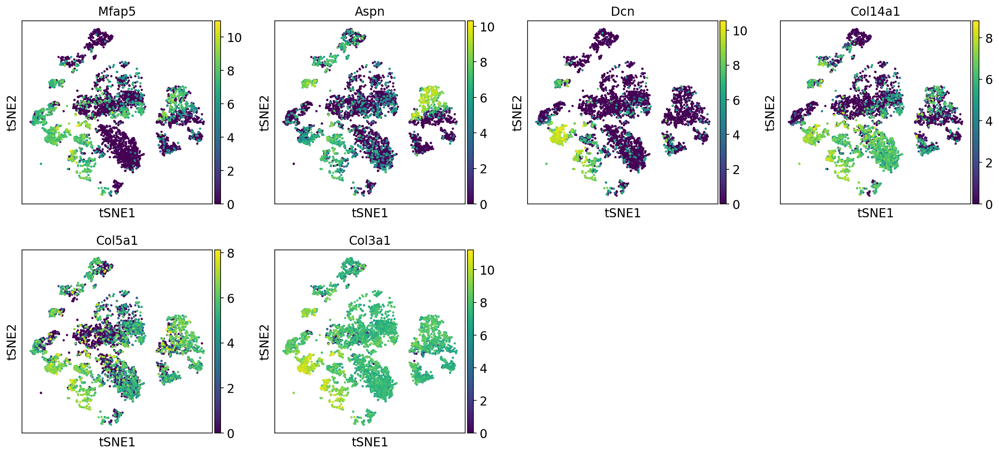

In [41]:
sc.pl.tsne(adata, color=['Mfap5', 'Aspn', 'Dcn', 'Col14a1', 'Col5a1','Col3a1'], save='Mfap5 blabla expression.png')

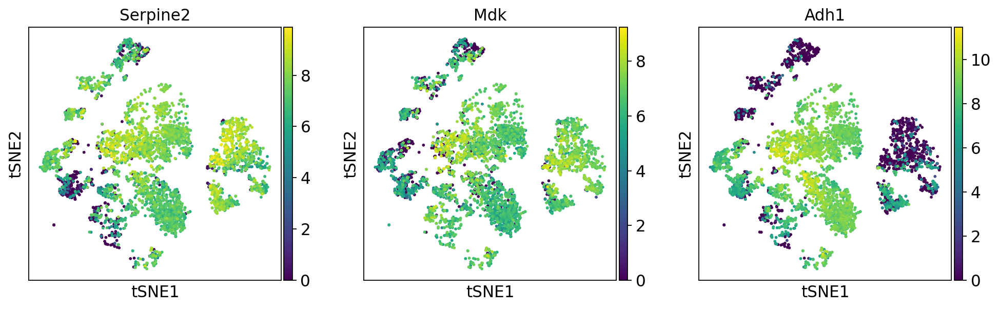

In [42]:
sc.pl.tsne(adata, color=['Serpine2', 'Mdk','Adh1'], save='Serpine2 blabla expression.png')

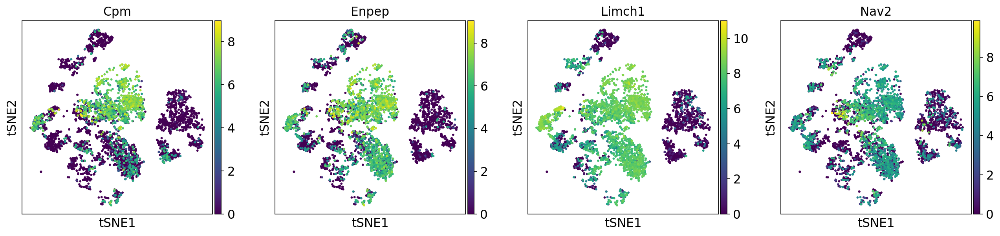

In [43]:

sc.pl.tsne(adata, color=['Cpm', 'Enpep', 'Limch1',  'Nav2'], save='Cpm blabla expression.png')

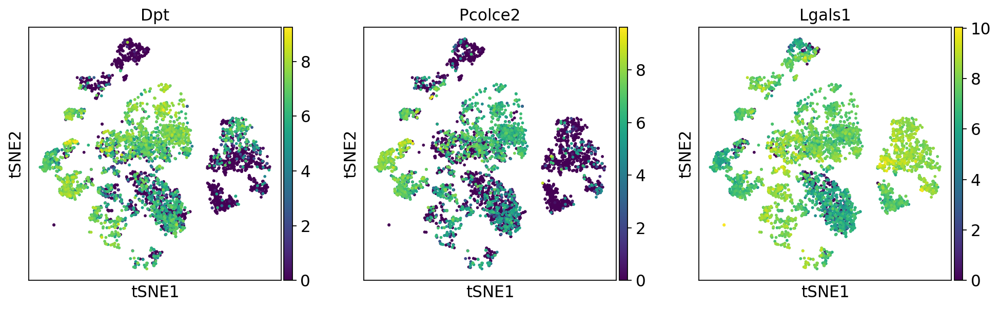

In [44]:
sc.pl.tsne(adata, color=['Dpt', 'Pcolce2', 'Lgals1'], save='Dpt blabla expression.png')

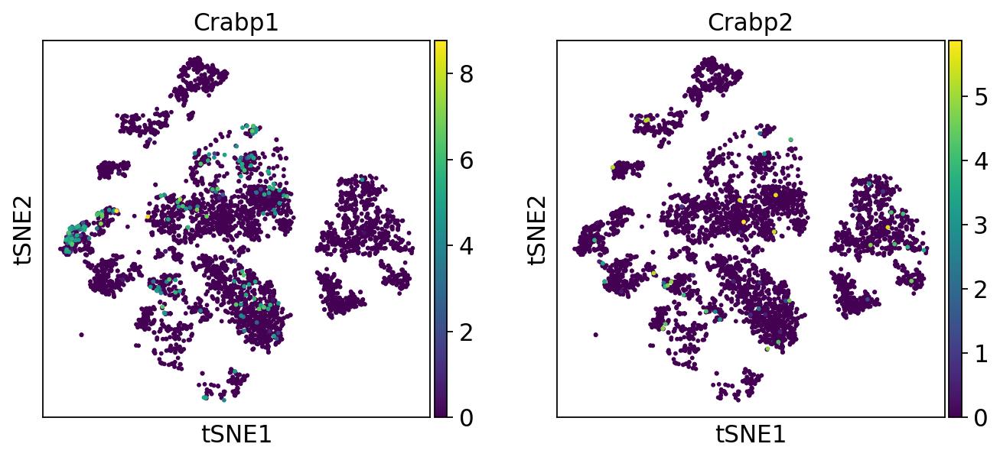

In [45]:
sc.pl.tsne(adata, color=['Crabp1','Crabp2'])

/usr/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


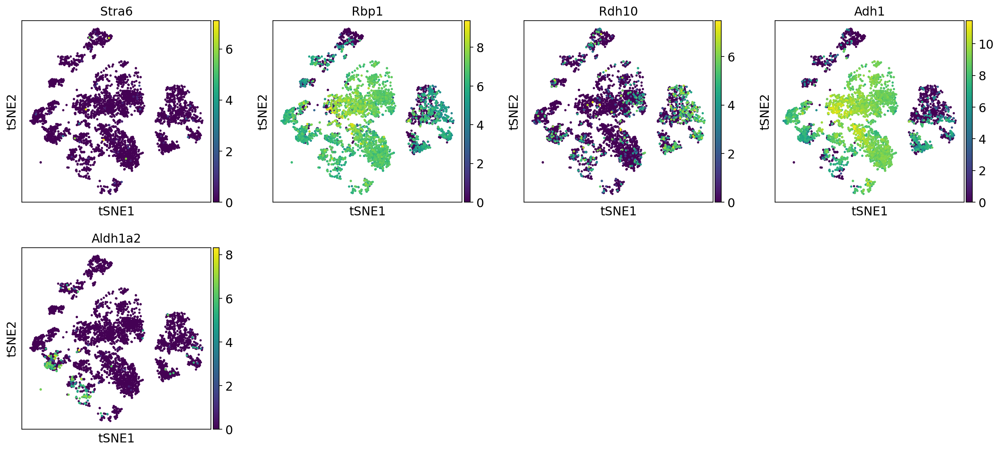

In [55]:
sc.pl.tsne(adata, color=['Stra6','Rbp1','Rdh10','Adh1','Aldh1a2'],save='Stra6 related gene expression.png')

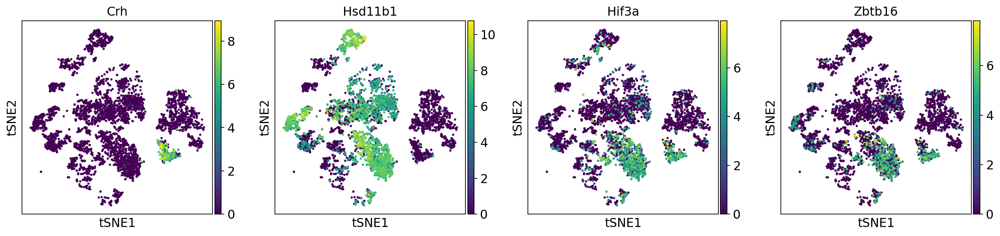

In [57]:
sc.pl.tsne(adata, color=['Crh','Hsd11b1','Hif3a','Zbtb16'],save='Crh related gene expression.png')

/usr/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'DC' as categorical
... storing 'Gender' as categorical
... storing 'Mousename' as categorical
... storing 'SortType' as categorical
... storing 'Time [days]' as categorical
... storing 'Timepoint' as categorical
... storing 'TimepointHO' as categorical
... storing 'Treatment' as categorical
... storing 'Well' as categorical
... storing 'cellRoughSubtype' as categorical
... storing 'cellSubtype' as categorical
... storing 'cellSubtypeOld' as categorical
... storing 'cellType' as categorical
... storing 'Chromosome' as categorical
... storing 'missing_info' as categorical


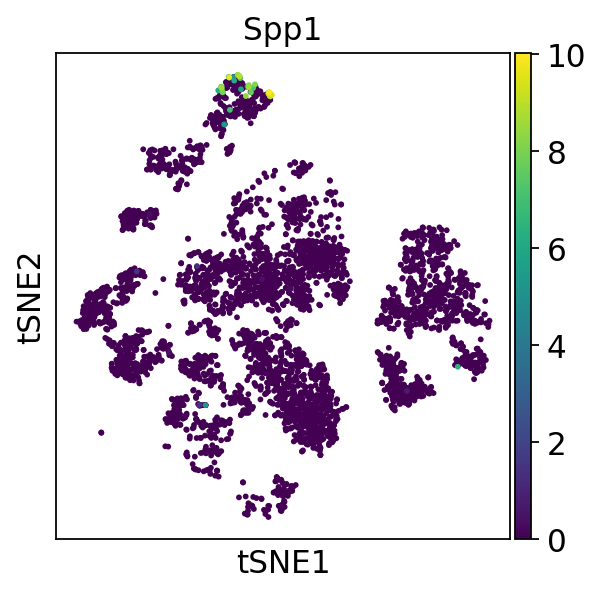

In [3]:
sc.pl.tsne(adata, color='Spp1')

In [48]:
adata_precursor=adata[adata.obs['cellSubtype']=='Fibroblast precursor']
adata_adventitial_alveolar=adata[adata.obs['cellSubtype'].isin(['Adventitial fibroblast','Alveolar fibroblast'])]
exp1=adata_precursor[:,'Hsd11b1'].X.toarray()[:,0]
exp2=adata_adventitial_alveolar[:,'Hsd11b1'].X.toarray()[:,0]

/usr/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


<AxesSubplot:>

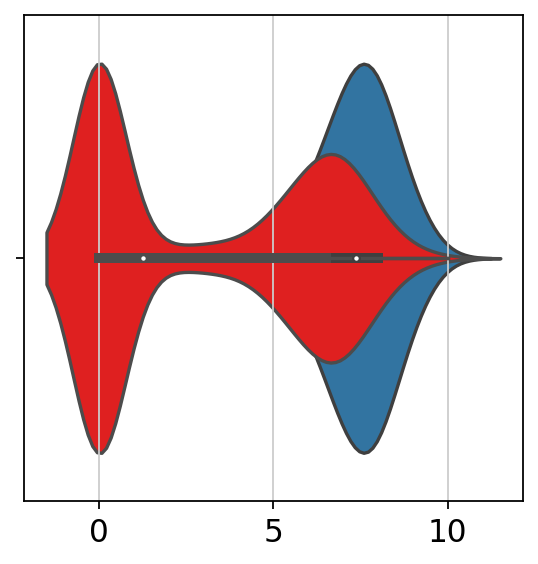

In [49]:
sns.violinplot(exp1)
sns.violinplot(exp2,color='red',alpha=0.2)

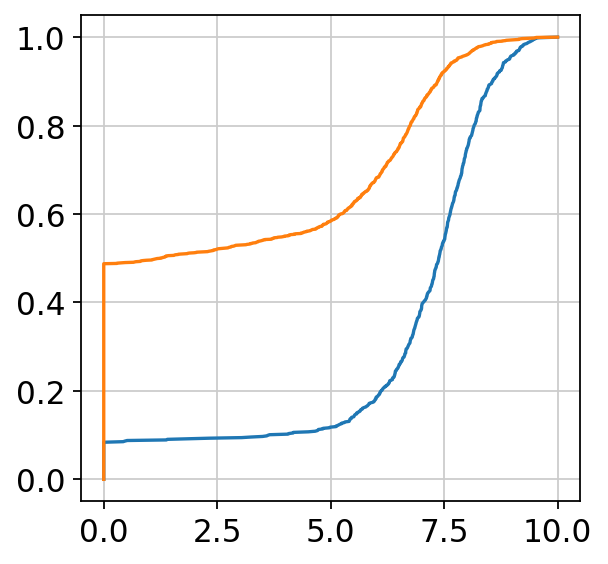

In [50]:
sort_exp1=np.sort(exp1)
cumulative1=np.linspace(0,1,len(sort_exp1))
plt.plot(sort_exp1,cumulative1)

sort_exp2=np.sort(exp2)
cumulative2=np.linspace(0,1,len(sort_exp2))
plt.plot(sort_exp2,cumulative2)

In [51]:
log_precursor_mean=exp1.mean()
log_adventitial_alveolar_mean=exp2.mean()
log_fold_change_Hsd11b1=log_adventitial_alveolar_mean-log_precursor_mean
log_fold_change_Hsd11b1

-3.5908804

In [52]:
exp1_all=adata_precursor.X.toarray()
exp2_all=adata_adventitial_alveolar.X.toarray()
exp1_all.mean(axis=0) #计算每个基因的平均表达，而不是把所有数据都计算平均数
exp2_all.mean(axis=0)
log_fold_change1=exp2_all.mean(axis=0)-exp1_all.mean(axis=0)
log_fold_change1
genes_log_fold_change1=pd.Series(log_fold_change1,index=adata.var_names)
genes_log_fold_change1.sort_values().to_excel('excels/log_fold_change_precursors&adventitial_and_alveoalr.xlsx')

In [53]:
genes_log_fold_change1.sort_values(ascending=False)

Igfbp7     3.403383
Cpm        2.782379
Mfap5      2.723613
Lgals1     2.706734
Myl9       2.701178
             ...   
Col14a1   -2.775856
Lox       -2.801471
Rgs2      -2.868537
S1pr3     -3.034152
Hsd11b1   -3.590880
Length: 18072, dtype: float32

In [54]:
genes_log_fold_change1['Lox']

-2.801471